# Imports

In [22]:
import pandas as pd 
import seaborn as sns
import numpy as np 
import matplotlib.pyplot  as plt 
from sklearn.model_selection import train_test_split
#from xgboost import XGBRegressor
from sklearn.cross_decomposition import PLSRegression
from sklearn.metrics import mean_squared_error,r2_score,mean_absolute_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import SGDRegressor,PassiveAggressiveRegressor
from sklearn.svm import SVC
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler,normalize,MinMaxScaler
import glob
import xgboost as xgb

# Helpers

In [5]:
from pandas.io.pytables import DataCol
def Visualize_MeanValues_DataSet(dataset):
  temp=dataset.drop(columns=["WVN CM-1"])
  # meanvalues=temp.mean()
  values=[float(val) for val in temp.columns.values ]
  values =[(1/val)*10000000 for val in values ]
  # row=0
  # while (row<dataset.shape[0]):
    
  #   sample =dataset.iloc[row:row+3,:]
  #   sn.scatterplot(x=values,y=100-sample.mean().values);
  #   row=row+3
  sn.lineplot(x=values,y=np.log10(1/temp.rows).values);
  plt.ylabel('absorbtion precentage (%)')
  plt.xlabel('wavelength (nm)')

def calc_standard(dataset):
  x = dataset.values #returns a numpy array
  min_max_scaler = StandardScaler()
  x_scaled = min_max_scaler.fit_transform(x)
  return pd.DataFrame(x_scaled,columns=dataset.columns)
  
def snv(input_data):
  
    # Define a new array and populate it with the corrected data  

    for i in range(input_data.shape[0]):
 
        # Apply correction
        input_data.iloc[i,:] = (input_data.iloc[i,:] - np.mean(input_data.iloc[i,:])) / np.std(input_data.iloc[i,:])
 
    return input_data
def Vector_normalization(dataset):
  temp=snv(dataset)
  for i in range(temp.shape[0]):
 
        # Apply correction
        temp.iloc[i,:] = (temp.iloc[i,:]) / np.linalg.norm(temp.iloc[i,:])
 
  return temp

def calc_minMax(dataset):
  x = dataset.values #returns a numpy array
  min_max_scaler = MinMaxScaler()
  x_scaled = min_max_scaler.fit_transform(x)
  return pd.DataFrame(x_scaled,columns=dataset.columns)

def meanfor_each_Sample(dataset,scaler=False,MinMax=False,snv_flag=False,VN=False):
  numtostr=[str(value) for value in dataset['WVN CM-1']]
  samples=[number[0:-1] for number in numtostr]
  if(dataset.iloc[0,-1]==' '):##some file come up with empty columns 
    dataset.drop(columns=dataset.columns[-1], 
          axis=1, 
          inplace=True)
  temp=dataset.drop(columns=["WVN CM-1"])
  temp=np.log10(1/(temp/100))
  if(VN):
    temp=Vector_normalization(temp)
  if(snv_flag):
    temp=snv(temp)
  if(scaler):
    temp=calc_standard(temp)
  if(MinMax):
    temp=calc_minMax(temp)
 

  temp_dict={}
  sample_mean_list=[];
  keys=[]
  counter=0
  for i in range(0,dataset.shape[0],3):
    temp_dict["{}".format(samples[counter])]=temp[i:i+3].mean()
    keys.append("{}".format(samples[counter]))
    counter=counter+3
  sample_mean_list.append(temp_dict)
  return sample_mean_list,keys

def visualize_samples(filenames,scaler=False,MinMax=False,snv_flag=False,VN=False):
  all_samples_mean=[]
  for onefile in filenames:
    data=pd.read_csv(onefile, keep_default_na=False)
    result,keys=meanfor_each_Sample(data,scaler=scaler,MinMax=MinMax,snv_flag=snv,VN=VN)
    all_samples_mean.append(result);
  temp=data.drop(columns=["WVN CM-1"])
  values=[float(val) for val in temp.columns.values ]
  values =[(1/val)*10000000 for val in values ]
  for key in keys:
    plt.figure(figsize=(10,5));
    for means in all_samples_mean:
      sn.lineplot(x=values,y=means[0][key].values);
      plt.ylabel('absorbtion');
      plt.xlabel('wavelength (nm)');
      plt.title("Mean values for sample id {} for diffrent scanners".format(key));
      plt.legend(filenames);
  plt.figure(figsize=(15,10));
  for key in keys:
    temp_list=[]
    for means in all_samples_mean:
      temp_list.append(means[0][key].values)
    sn.lineplot(x=values,y=[sum(sub_list) / len(sub_list) for sub_list in zip(*temp_list)]);
  plt.ylabel('absorbtion ');
  plt.xlabel('wavelength (nm)');
  plt.title("Mean values for diffrent samples for diffrent scanners");
  plt.legend(["sample_Id {}".format(val) for val in keys]);


In [6]:
def eval_results(train_pred,train_label,
                 val_pred,val_label,
                 model_name,test_name) : 
  eval_dict={}
  eval_dict["model_name"]=model_name
  eval_dict["test_name"]=test_name

  eval_dict["train_mean_squared_error"]=mean_squared_error(train_pred,train_label)
  eval_dict["val_mean_squared_error"]=mean_squared_error(val_pred,val_label)

  eval_dict["train_mean_absolute_error"]=mean_absolute_error(train_pred,train_label)
  eval_dict["val_mean_absolute_error"]=mean_absolute_error(val_pred,val_label)

  eval_dict["train_r2_score"]=r2_score(train_pred,train_label)
  eval_dict["val_r2_score"]=r2_score(val_pred,val_label)
  return eval_dict

# Visualize scanners data

In [11]:
path = "./data"
filenames = glob.glob(path + "/*.csv")

In [12]:
filenames

['./data\\scannerr_52.csv',
 './data\\scanner_11.csv',
 './data\\Scanner_22.csv',
 './data\\Scanner_3.csv',
 './data\\scanner_4.csv',
 './data\\Scanner_41.csv',
 './data\\scanner_74.csv']

C:\Users\Mazen\AppData\Local\Temp\ipykernel_21184\3648338981.py:88: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10,5));


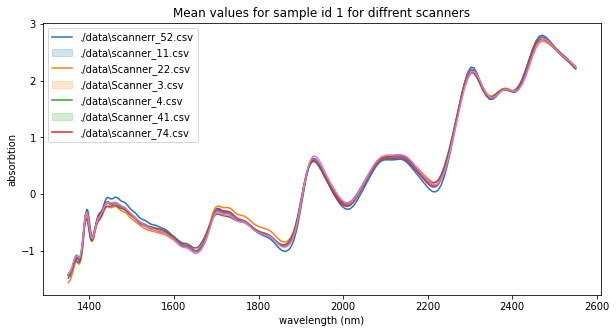

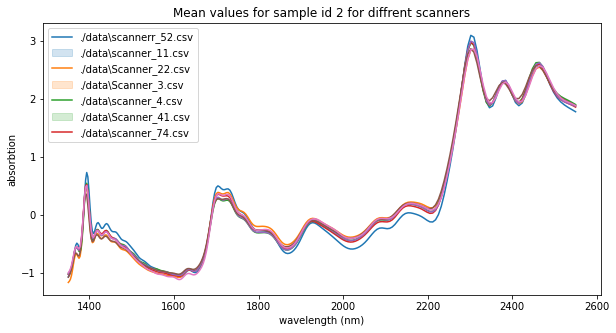

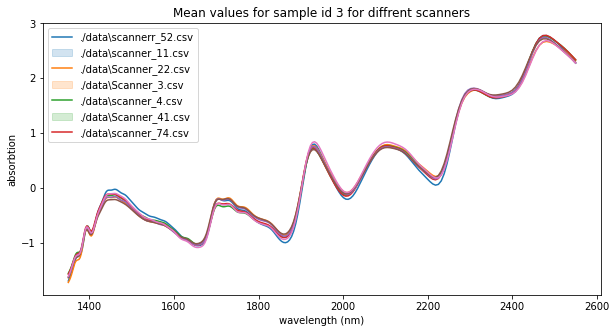

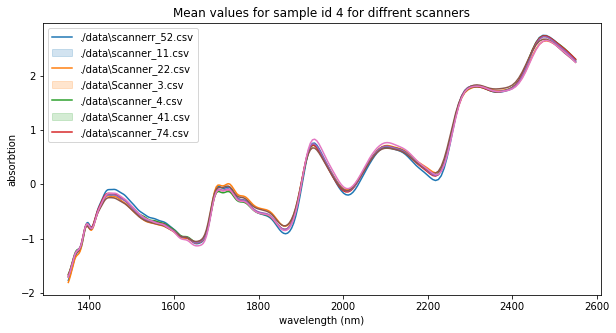

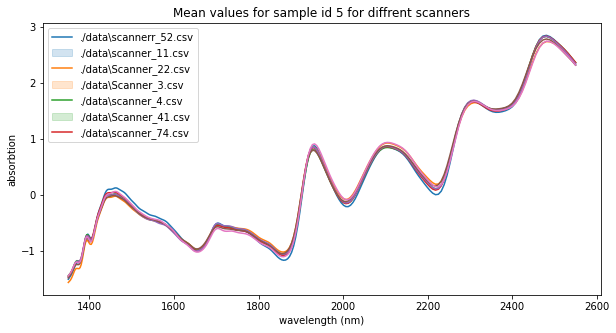

...

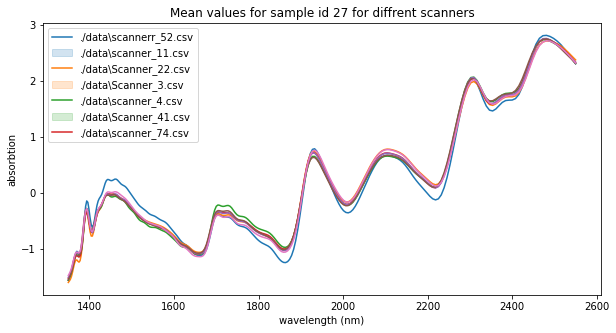

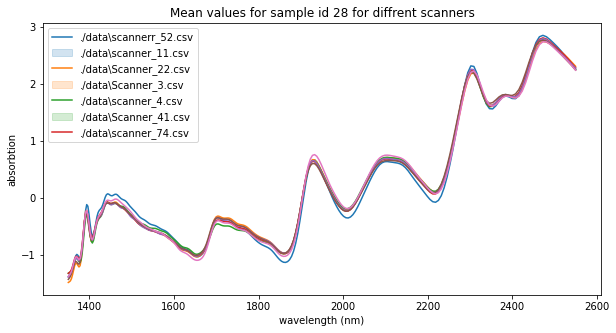

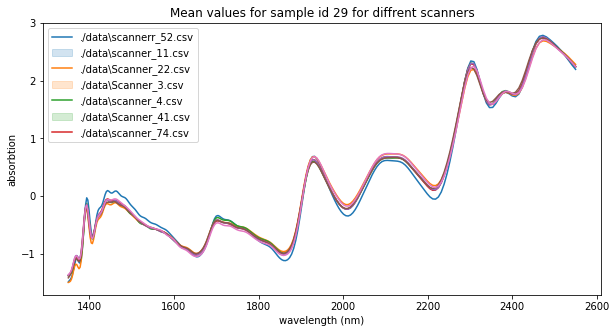

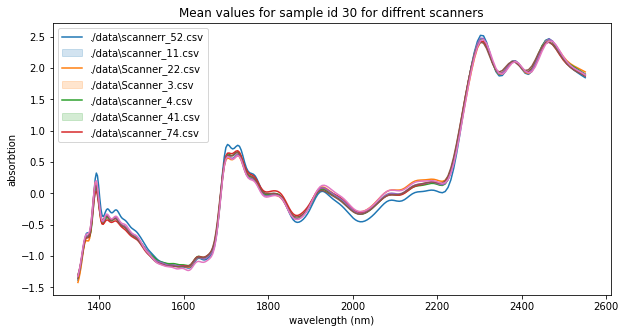

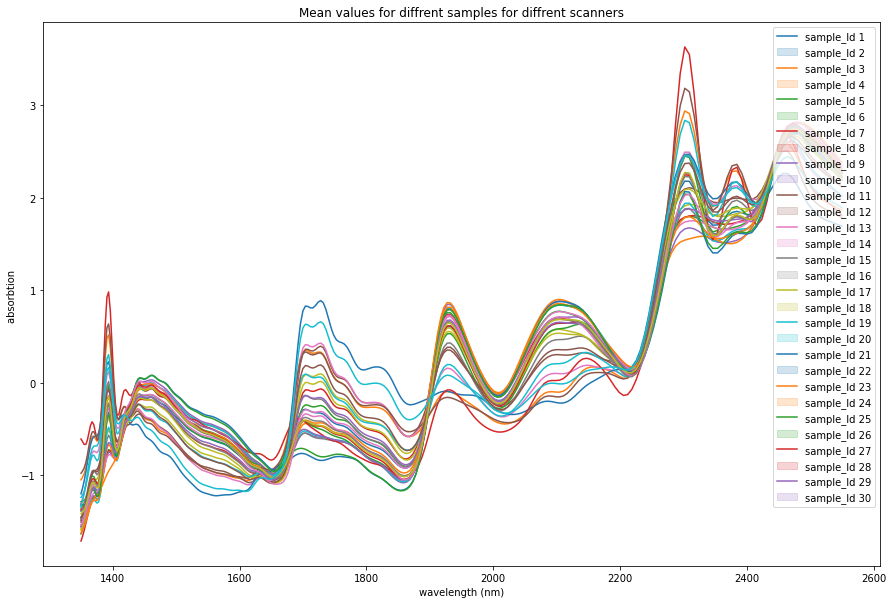

In [13]:
visualize_samples(filenames)

## visualize samples after Standard Scaler

C:\Users\Mazen\AppData\Local\Temp\ipykernel_21184\3648338981.py:88: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10,5));


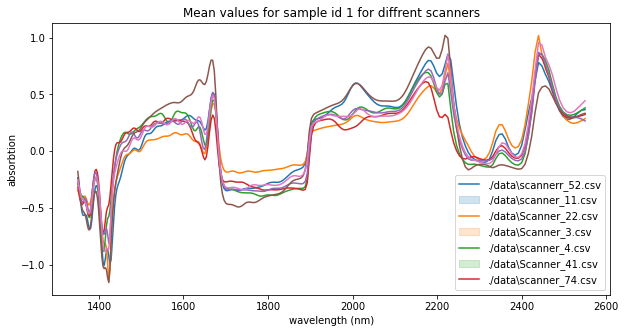

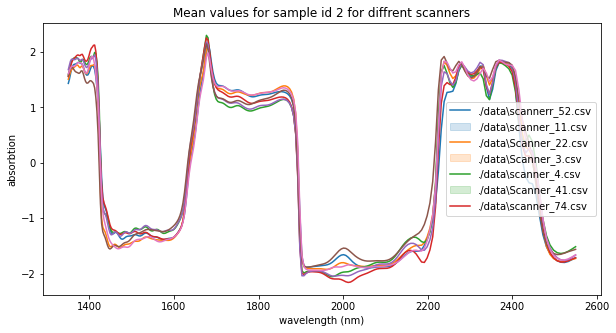

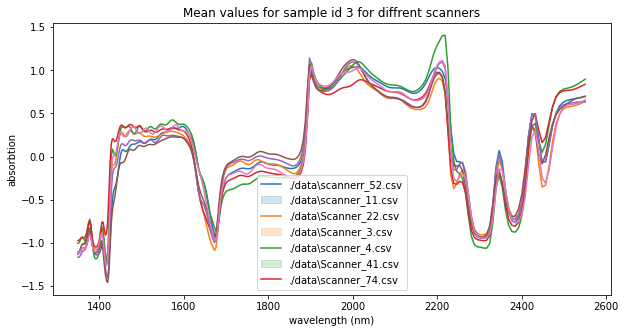

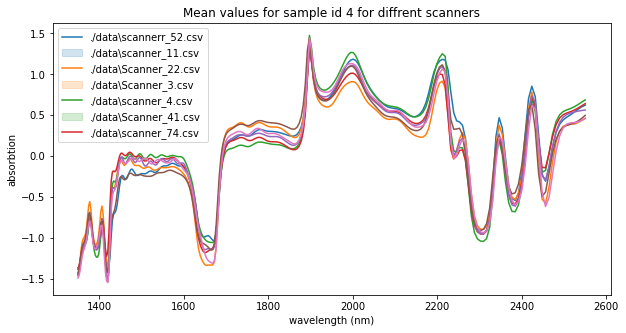

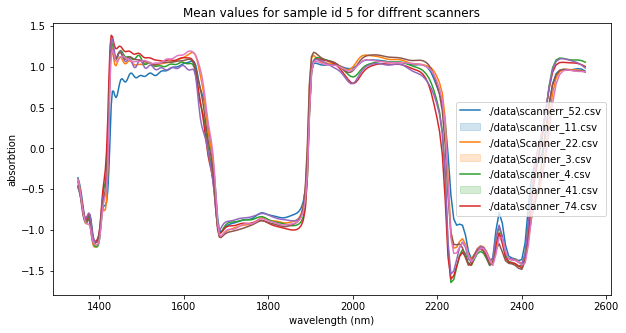

...

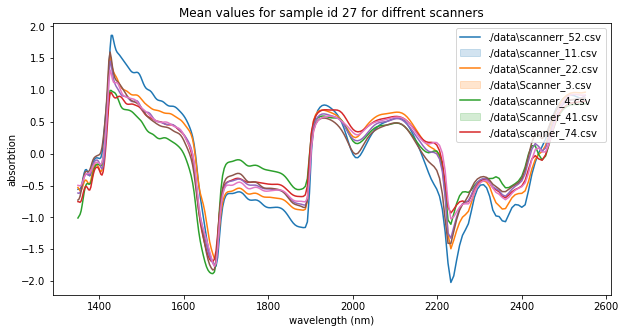

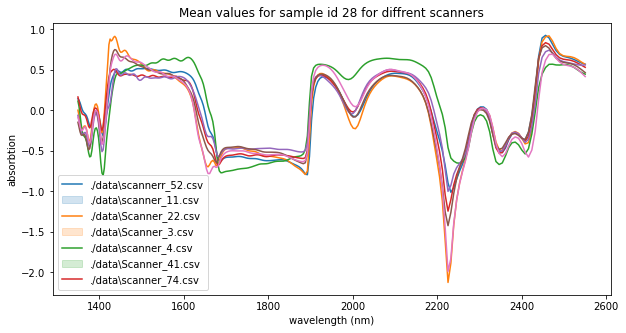

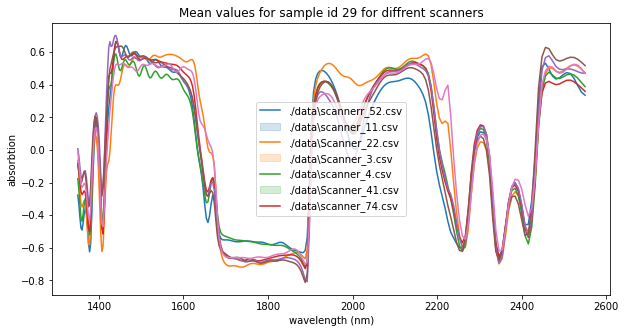

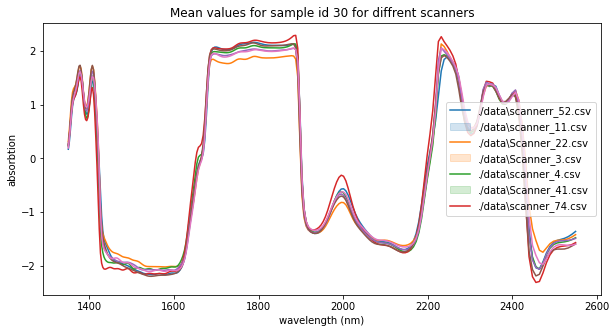

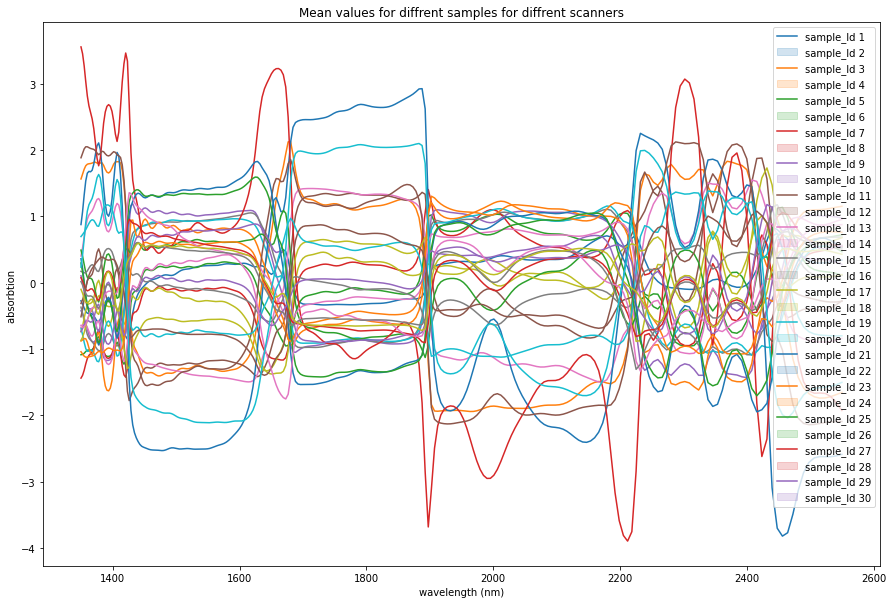

In [15]:
visualize_samples(filenames,scaler=True)

## visualize samples after normalization

C:\Users\Mazen\AppData\Local\Temp\ipykernel_21184\3648338981.py:88: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10,5));


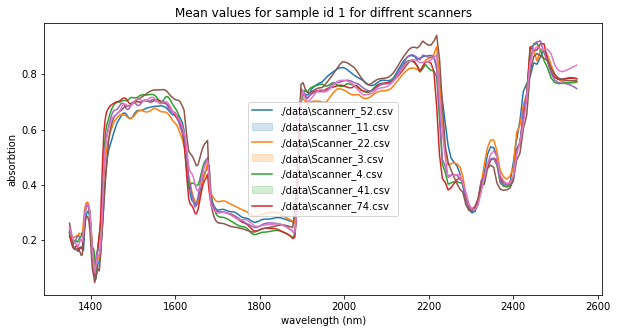

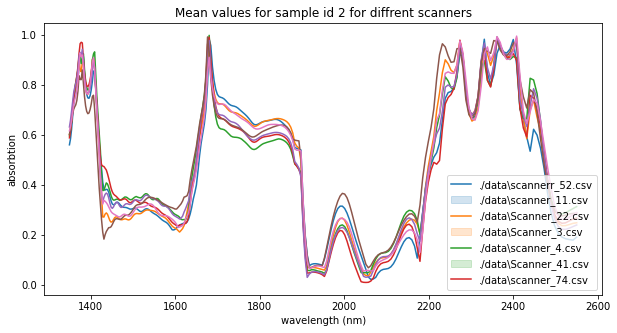

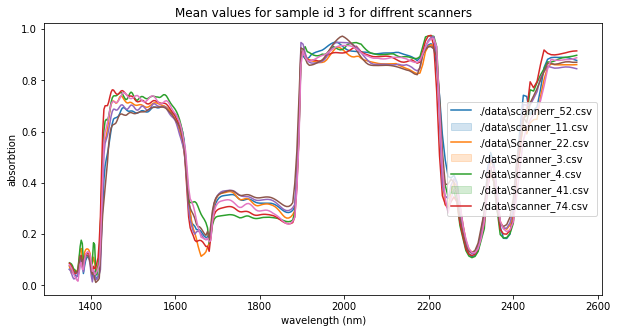

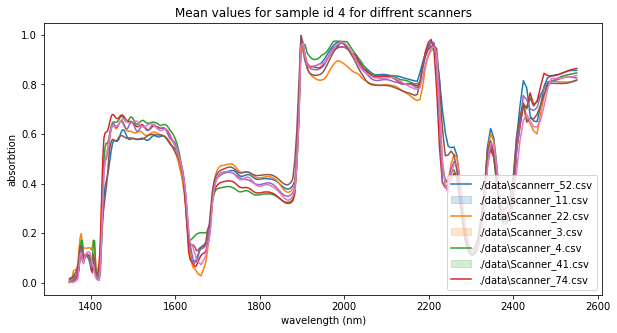

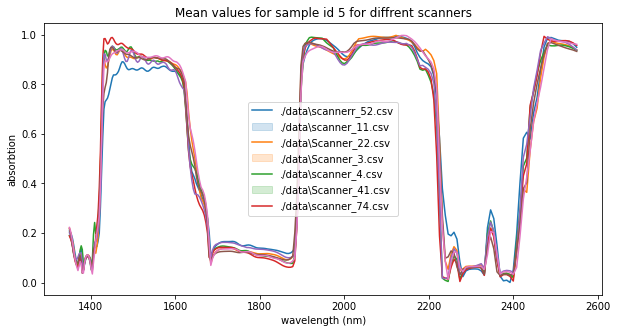

...

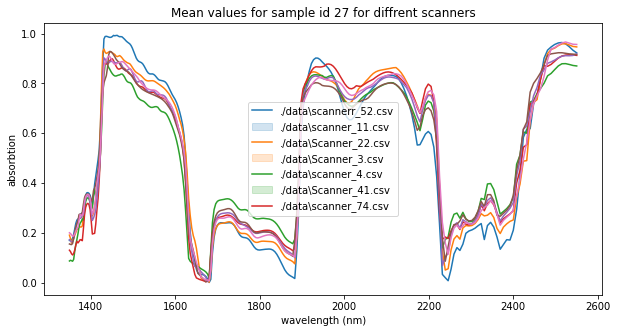

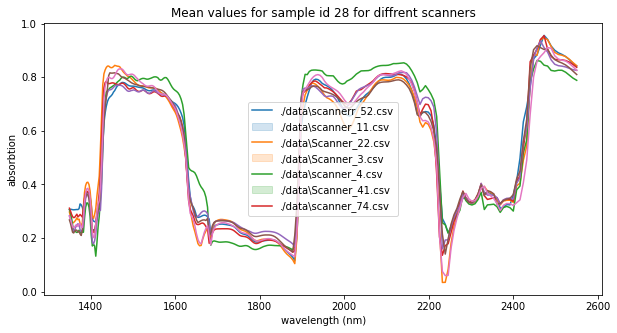

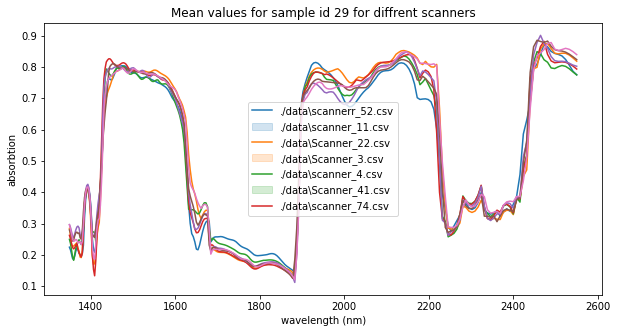

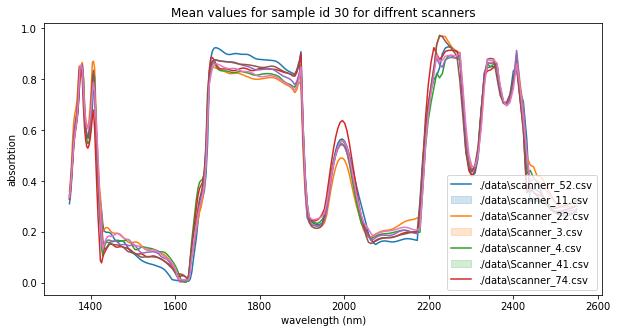

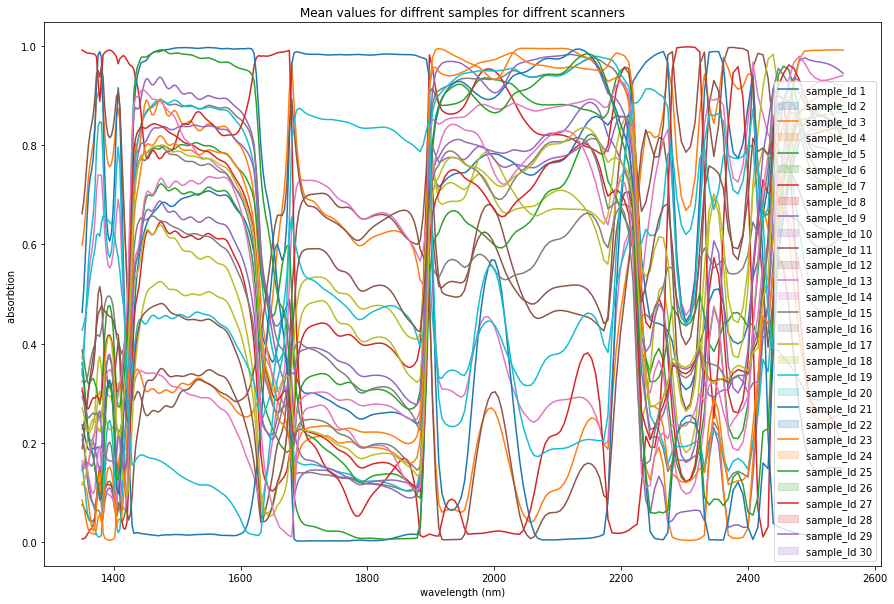

In [16]:
visualize_samples(filenames,MinMax=True)

## visualize samples after Standard normal varient

C:\Users\Mazen\AppData\Local\Temp\ipykernel_21184\3648338981.py:88: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10,5));


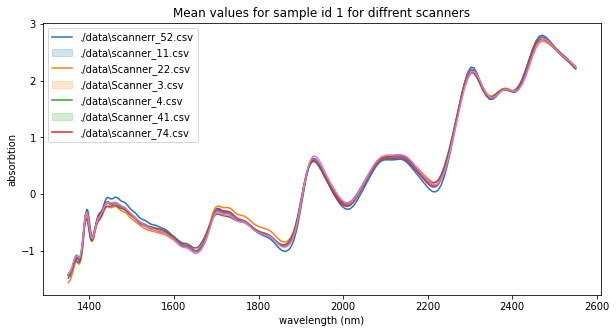

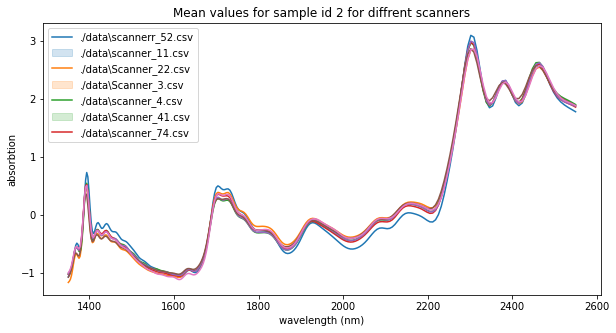

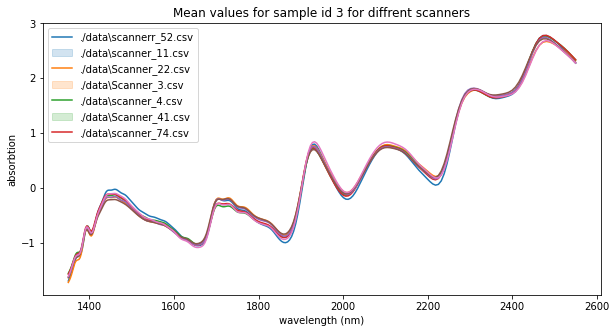

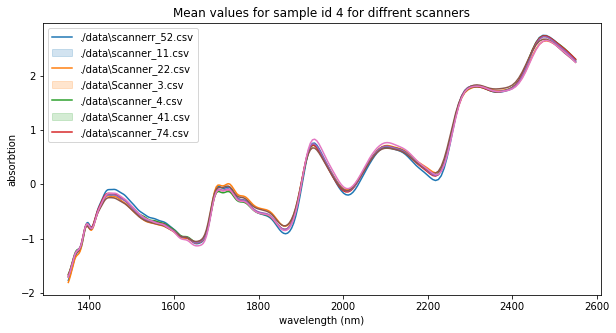

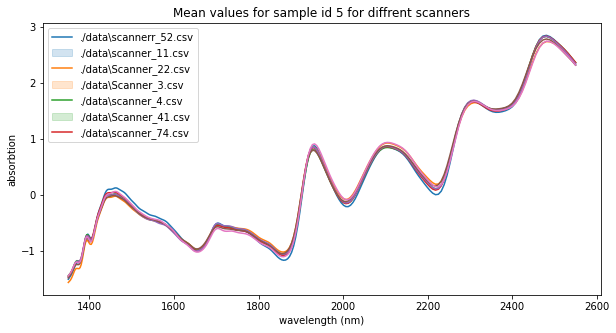

...

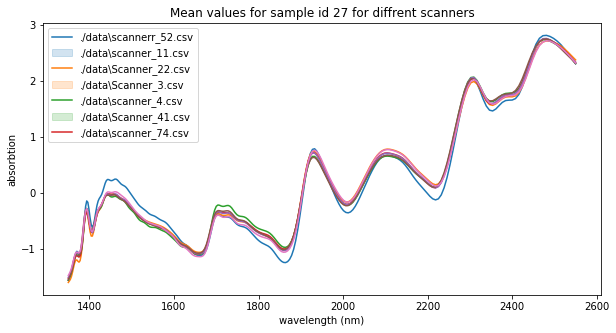

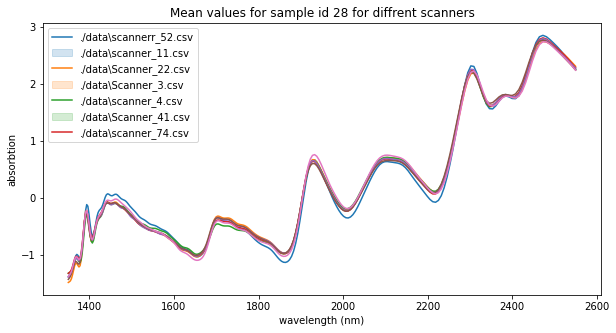

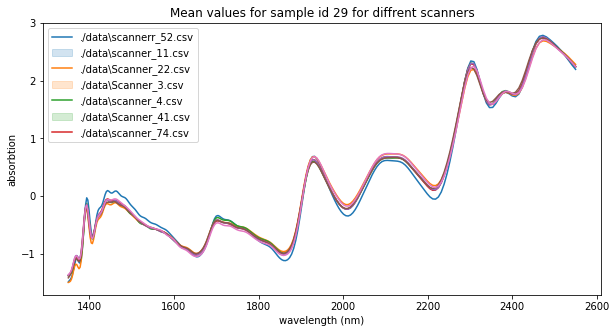

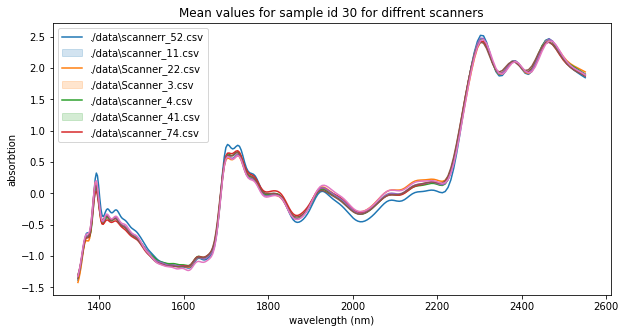

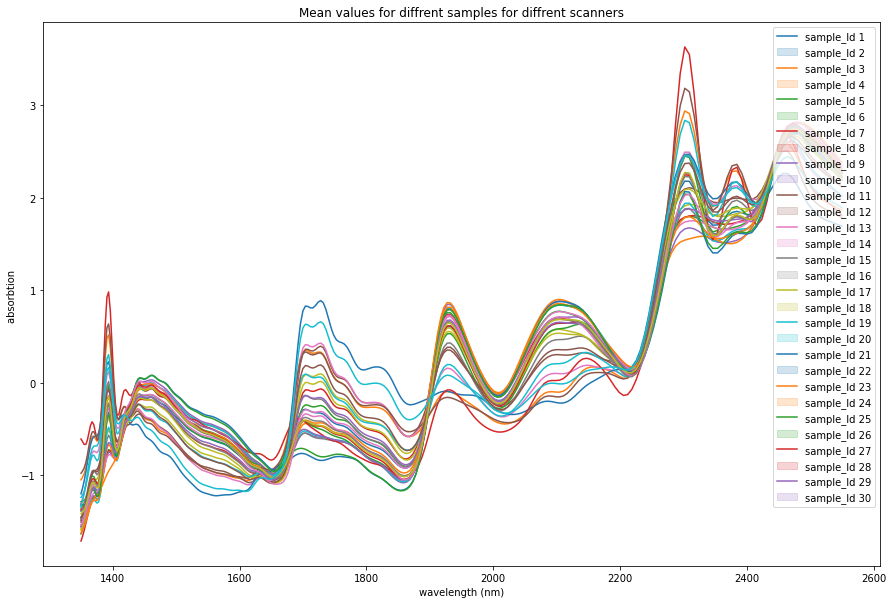

In [17]:
visualize_samples(filenames,snv_flag=True)

## visualize samples after Standard normal varient and standard Scaler

<ipython-input-66-07f561cbaa77>:87: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(10,5));
<ipython-input-66-07f561cbaa77>:87: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(10,5));
<ipython-input-66-07f561cbaa77>:87: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(10,

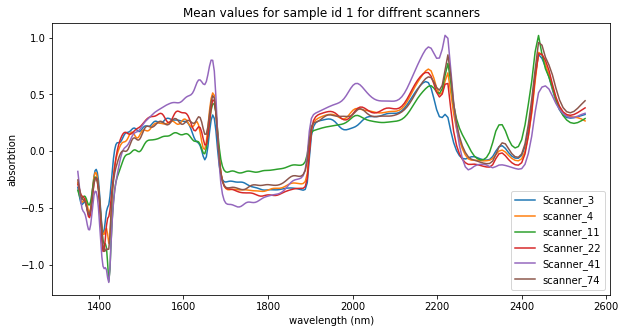

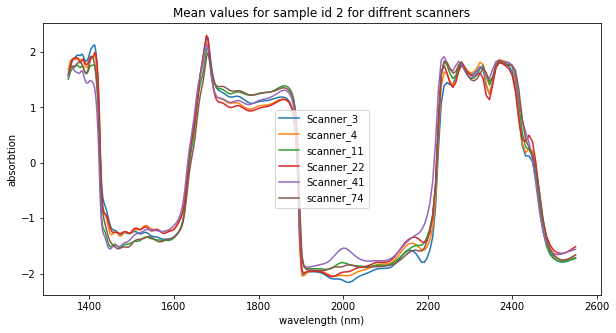

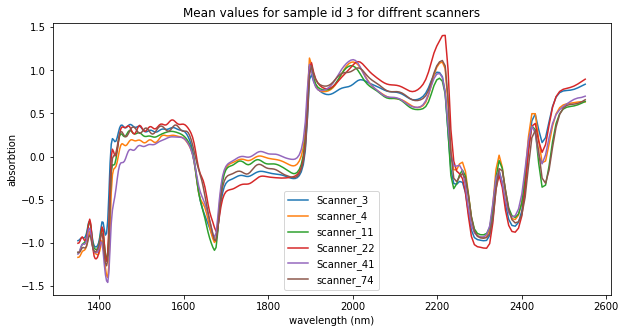

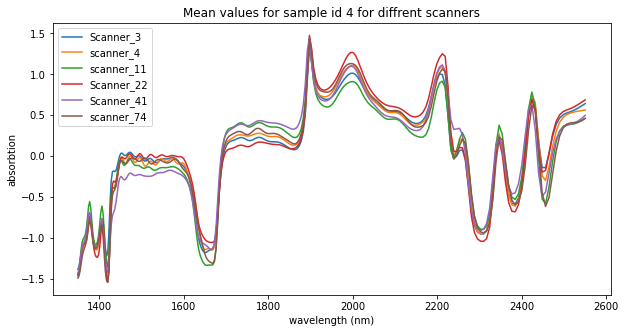

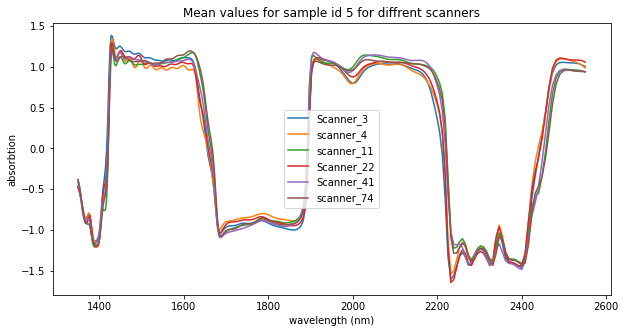

...

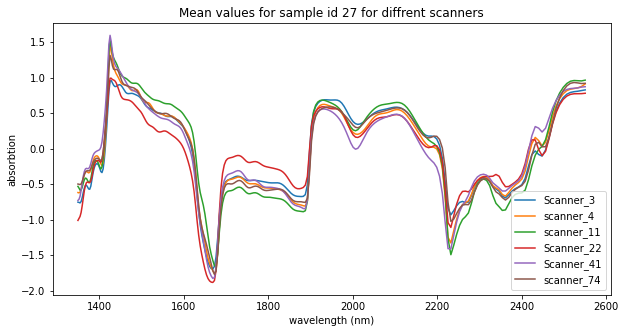

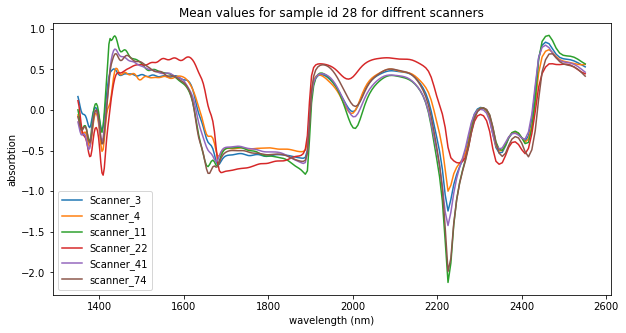

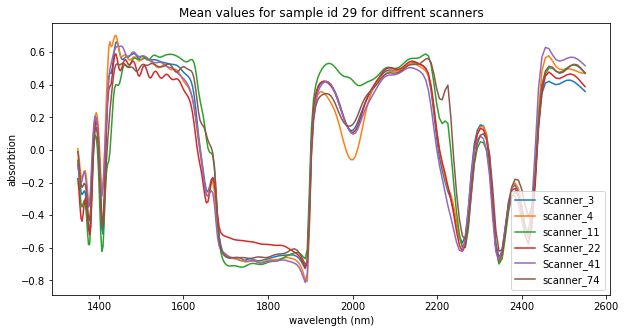

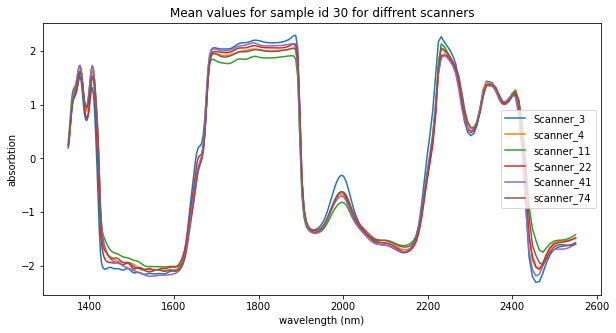

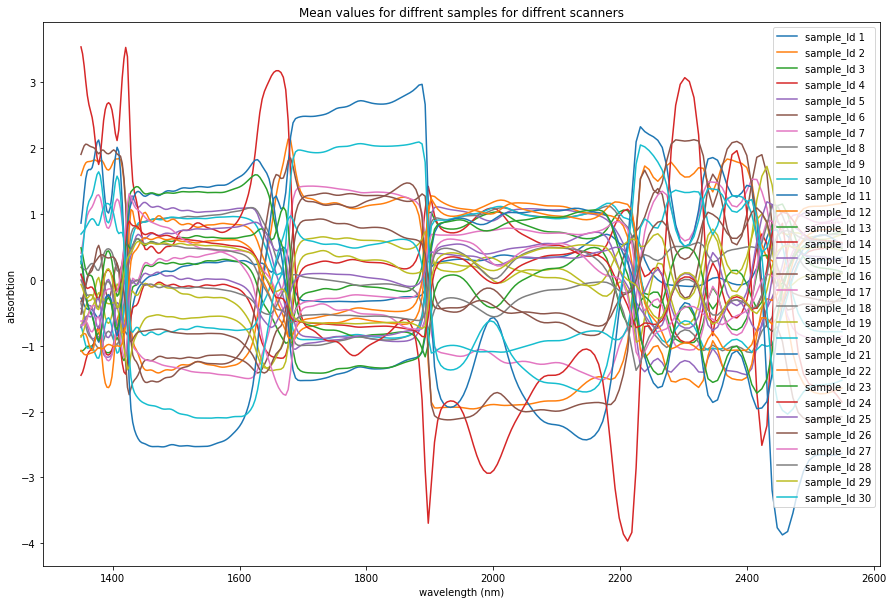

In [ ]:
visualize_samples(filenames,snv_flag=True,scaler=True)

C:\Users\Mazen\AppData\Local\Temp\ipykernel_21184\3648338981.py:88: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10,5));


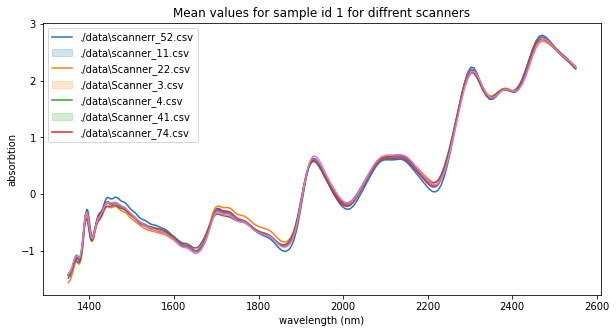

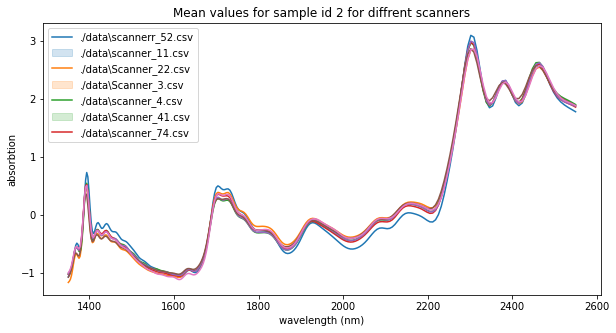

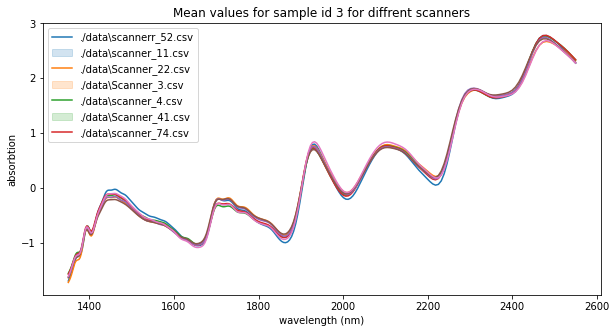

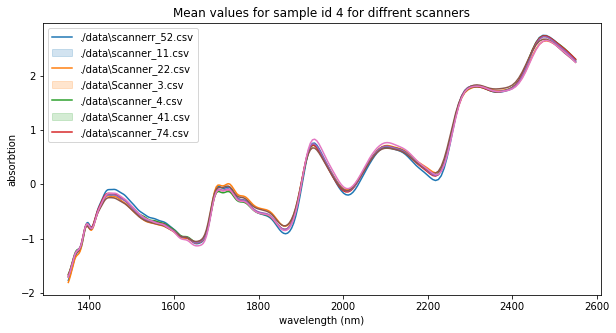

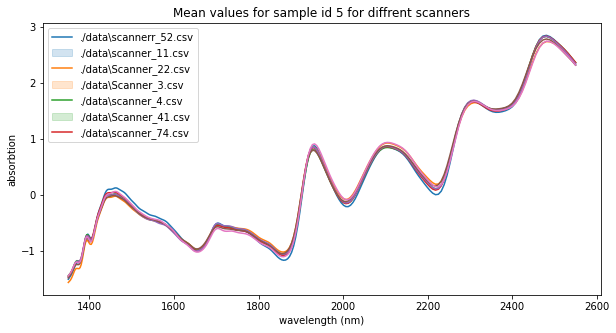

...

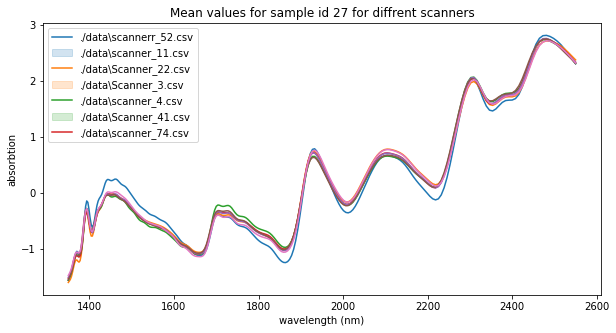

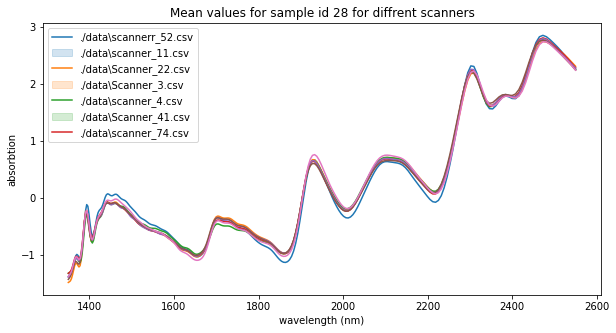

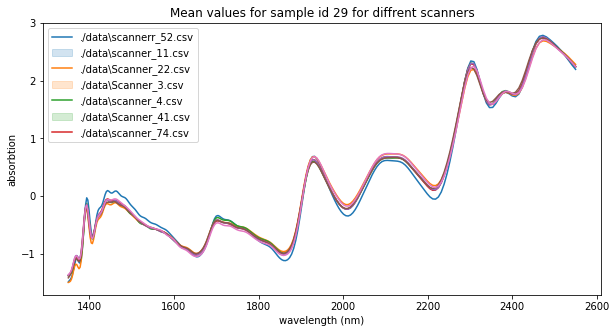

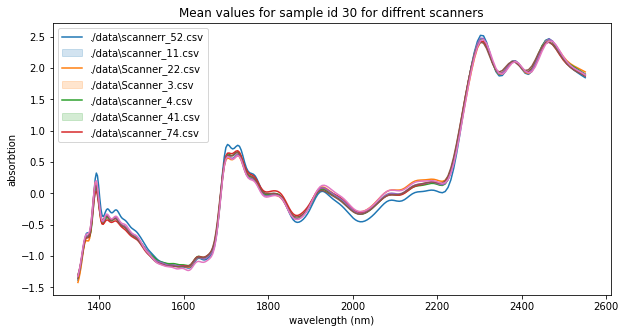

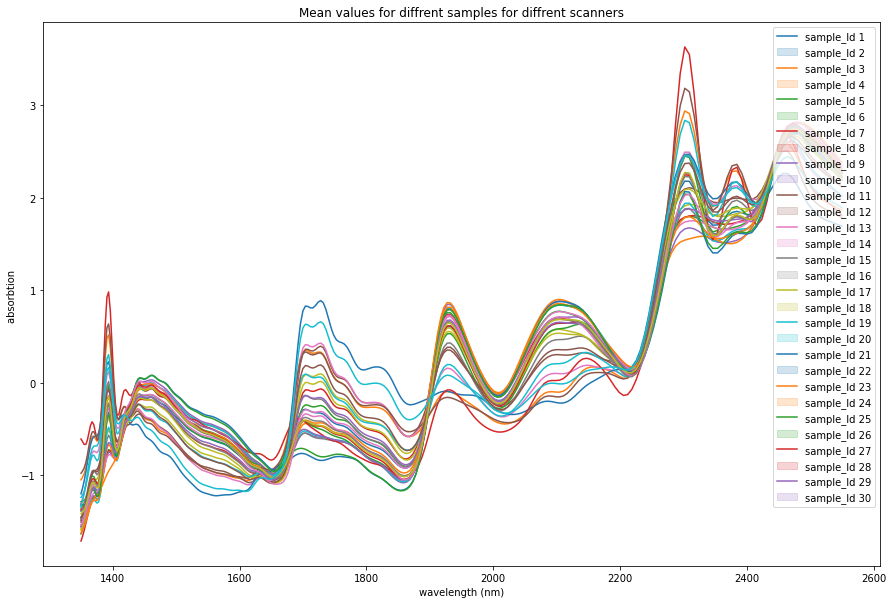

In [18]:
visualize_samples(filenames,VN=True)

# Preparing data

In [8]:
path ="./data"
filenames = glob.glob(path + "/*.csv")
test_file=filenames[-1]
ref_file= glob.glob(path + "/*.xlsx")
data_aggregation={
    'training':pd.DataFrame(),
    'validation':pd.read_csv(test_file, keep_default_na=False,header=None),
    'ref':pd.read_excel(ref_file[0]),
}
li_df = []
for onefile in filenames[:-1]:
  data=pd.read_csv(onefile, keep_default_na=False,header=None)
  if(data.iloc[0,-1]==' '):##some file come up with empty columns 
      data.drop(columns=data.columns[-1], 
          axis=1, 
          inplace=True)
  headers = ['ID' if (i==0) else'Result_'+ str(i) for i in range(0,data.shape[1])]
  data.columns =headers
  Wave_length = data.iloc[0]
  data.drop([data.index[0]],inplace = True)
  data['ID'] = data['ID'].astype(int)
  data['Sample ID'] = (data['ID']/10).astype(int)
  df2 = data.groupby(['Sample ID']).mean().reset_index()
 #df2['Scanner_Name'] = onefile.split(sep= '\\')[-1].split(sep='.')[0]
  data_ref = data_aggregation['ref'].groupby(['Sample ID']).mean().reset_index()
  df3 = pd.merge(df2,data_ref,on='Sample ID')
  df3.drop(['ID','Sample ID'],axis=1,inplace=True)

  li_df.append(df3)

data_aggregation['training'] = pd.concat(li_df)

if(data_aggregation['validation'].iloc[0,-1]==' '):##some file come up with empty columns 
  data_aggregation['validation'].drop(columns=data_aggregation['validation'].columns[-1], 
          axis=1, 
          inplace=True)
data_aggregation['validation'].columns=headers
data_aggregation['validation'].drop([data_aggregation['validation'].index[0]],inplace = True)
data_aggregation['validation']['ID'] = data_aggregation['validation']['ID'].astype(int)
data_aggregation['validation']['Sample ID'] = (data_aggregation['validation']['ID']/10).astype(int)
data_aggregation['validation'] = data_aggregation['validation'].groupby(['Sample ID']).mean().reset_index()
#data_aggregation['validation']['Scanner_Name'] = test_file.split(sep= '\\')[-1].split(sep='.')[0]
data_ref = data_aggregation['ref'].groupby(['Sample ID']).mean().reset_index()
data_aggregation['validation'] = pd.merge(data_aggregation['validation'],data_ref,on='Sample ID')
data_aggregation['validation'].drop(['ID','Sample ID'],axis=1,inplace=True)



In [9]:
data_aggregation['training'].head()

,Result_1,Result_2,Result_3,Result_4,Result_5,Result_6,Result_7,Result_8,Result_9,Result_10,...,Result_250,Result_251,Result_252,Result_253,Result_254,Result_255,Result_256,Result_257,TLC/SUM,Starch/SUM
0,36.376392,35.685458,35.032837,34.432826,33.867954,33.299307,32.695427,32.071206,31.517157,31.197545,...,86.699149,88.094064,89.848093,91.447055,92.570589,93.223285,93.670001,94.237365,20.673077,16.826923
1,44.558936,44.185172,43.800260,43.379382,42.868948,42.183101,41.241352,40.037516,38.702800,37.515649,...,75.639327,77.253334,79.399429,81.496857,83.135043,84.232581,84.992604,85.711932,36.178862,3.658537
2,28.396419,27.773642,27.154740,26.573493,26.051511,25.592486,25.193548,24.867877,24.664639,24.670686,...,77.326028,78.528804,80.023632,81.585530,83.045582,84.348089,85.531843,86.660419,9.210526,32.894737
3,25.630291,25.069445,24.526015,24.026548,23.577939,23.171515,22.799775,22.478526,22.261625,22.236565,...,73.638126,74.921412,76.540890,78.313893,80.070996,81.711161,83.204607,84.556958,7.731959,34.536082
4,36.492242,35.702220,34.950403,34.266908,33.659009,33.120725,32.653567,32.289766,32.104855,32.208676,...,86.737426,87.630900,88.721005,89.781503,90.664208,91.356735,91.956401,92.587726,10.952381,40.476190


In [10]:
data_aggregation['validation'].head()

,Result_1,Result_2,Result_3,Result_4,Result_5,Result_6,Result_7,Result_8,Result_9,Result_10,...,Result_250,Result_251,Result_252,Result_253,Result_254,Result_255,Result_256,Result_257,TLC/SUM,Starch/SUM
0,41.411917,40.713060,40.095422,39.539619,38.982173,38.365162,37.680394,37.001838,36.488309,36.345919,...,100.497069,101.425432,103.038825,104.918474,106.620401,107.883897,108.755255,109.423949,20.673077,16.826923
1,49.444016,49.050878,48.728153,48.377978,47.851687,47.019603,45.836477,44.403200,42.982249,41.941116,...,90.872640,92.028000,93.987520,96.259686,98.313275,99.821710,100.819492,101.514907,36.178862,3.658537
2,31.942291,31.298923,30.707897,30.168435,29.662963,29.182538,28.747028,28.415622,28.281588,28.448539,...,91.056290,92.035165,93.502655,95.281312,97.126310,98.821318,100.272009,101.478870,9.210526,32.894737
3,29.192398,28.617240,28.089556,27.603543,27.140423,26.692943,26.282656,25.966974,25.831174,25.965024,...,84.587760,85.775237,87.426249,89.411290,91.523887,93.545515,95.332726,96.825232,7.731959,34.536082
4,39.643108,38.852491,38.128221,37.478430,36.886784,36.345605,35.881311,35.565054,35.503720,35.811041,...,99.085112,99.755311,100.823625,102.049580,103.181701,104.078362,104.774501,105.383922,10.952381,40.476190


In [11]:
print(f"The Shape of Training Data is {data_aggregation['training'].shape}")

The Shape of Training Data is (180, 259)


In [12]:
print(f"The Shape of Validation Data is {data_aggregation['validation'].shape}")

The Shape of Validation Data is (30, 259)


# constructing PLS Model

In [13]:
list_result = []

In [25]:
def perform_model(data,test_type = 0,output_type = "Single",model_name = "PLS",data_aug =  "Default"):
  columns_test = ['TLC/SUM','Starch/SUM']
  X_train,X_test,y_train,y_test=train_test_split(data['training'].drop(columns=columns_test),data['training'][columns_test[test_type]],test_size=0.2)
  y_val=data['validation'][columns_test[test_type]]
  x_val=data['validation'].drop(columns=columns_test)

  if(model_name == "PLS"):
    model=PLSRegression(random_state=42)
    model.fit(X_train,y_train)
    pred = model.predict(X_test)
    plt.scatter(y_test, pred, color='red')
    plt.plot(y_test, y_test, '-g', label='Expected regression line')
    z = np.polyfit(y_test, pred, 1)
    plt.plot(np.polyval(z, y_test), y_test, color='blue', label='Predicted regression line')
    
    print("RMSE on the test set = {}".format(np.sqrt(mean_squared_error(y_test, pred))))
    print("R2  on the test set = {}".format(r2_score(y_test, pred)))
    v_pred = model.predict(x_val)
    z = np.polyfit(y_val, v_pred, 1)
    plt.plot(np.polyval(z, y_val), v_pred, color='red', label='Predicted regression line on validataion')
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.legend()
    plt.plot()
    print("RMSE on the validation set = {}".format(np.sqrt(mean_squared_error(y_val, v_pred))))
    print("R2  on the validation set = {}".format(r2_score(y_val, v_pred)))


  elif(model_name=="RF"):
    model = RandomForestRegressor(n_estimators = 100, criterion = 'mse', max_depth = None, 
                               min_samples_split = 2, min_samples_leaf = 1,random_state=42)
    model.fit(X_train,y_train)
    pred = model.predict(X_test)

    importances = list(model.feature_importances_)
  # List of tuples with variable and importance
    imp_dict = [{"feature":k,"importance":round(v,2) } for k,v in zip(X_train.columns,importances)]
  # Sort the feature importances by most important first
    imp_df = pd.DataFrame(imp_dict)
  #plotting results

   # list of x locations for plotting
    imp_df = imp_df.sort_values(by="importance", ascending=False).reset_index(drop=True).loc[:50]
    order = imp_df.groupby('feature').mean().sort_values('importance', ascending=False).index
    plt.figure(figsize=(10, 10))
    sns.set(font_scale=1)
    sns.barplot(x="feature", y="importance", data=imp_df,order=order)
    plt.title('Features')
    plt.tight_layout()
    plt.xticks(rotation=45);
    plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances'); 
  
    v_pred = model.predict(x_val);

  elif(model_name=="xgb"):
    dtrain = xgb.DMatrix(data=X_train,label=y_train)
    dtest =  xgb.DMatrix(data=x_val,label=y_val)

    # specify parameters via map set the objective to regression loss function
    param = {'max_depth':6, 'eta':0.01,'seed':0,
            'objective':'reg:squarederror',
            'subsample':0.9,
            'colsample_bytree':0.98,
            "metrics":'rmse'
            }
    # set nbr of iteration to 1000000000 
    num_iter = 1000000000
    # fit  the model and check the requirements params and set early stopping round params to 20 rounds 
    model=xgb.train(params=param,
                        dtrain=dtrain,
                        num_boost_round= num_iter,
                        evals=[(dtrain,"train")],
                        early_stopping_rounds=100,
                        verbose_eval=100)
    pred = model.predict(dtrain)
    v_pred = model.predict(dtest)

  
  result = eval_results(pred,y_test,v_pred,y_val,model_name,output_type+"_"+data_aug)
  list_result.append(result);

# Simultaions

In [26]:
perform_model(data_aggregation.copy(),0,model_name="RF")

C:\Users\Mazen\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\ensemble\_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(


KeyError: 'importance'

In [135]:
data_aggregation_standard={}
data_aggregation_standard['training']=calc_standard(data_aggregation['training'])
data_aggregation_standard['validation']=calc_standard(data_aggregation['validation'])
data_aggregation_standard['ref']=calc_standard(data_aggregation['ref'])

RMSE on the test set = 0.5161663127726032
R2  on the test set = 0.7243571146889081
RMSE on the validation set = 0.5513803314925765
R2  on the validation set = 0.6959797300431365


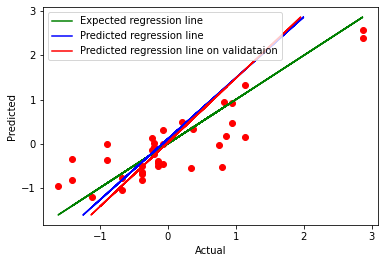

In [136]:
perform_model(data_aggregation_standard)

In [137]:
data_aggregation_minMax={}
data_aggregation_minMax['training']=calc_minMax(data_aggregation['training'])
data_aggregation_minMax['validation']=calc_minMax(data_aggregation['validation'])
data_aggregation_minMax['ref']=calc_minMax(data_aggregation['ref'])

RMSE on the test set = 0.14358150123201324
R2  on the test set = 0.5055988801653013
RMSE on the validation set = 0.12923901732336346
R2  on the validation set = 0.6655288932759978


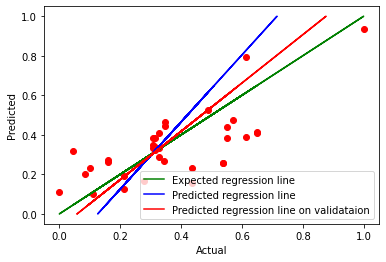

In [138]:
perform_model(data_aggregation_minMax)

In [139]:
data_aggregation_snv={}
data_aggregation_snv['training']=snv(data_aggregation['training'])
data_aggregation_snv['validation']=snv(data_aggregation['validation'])
data_aggregation_snv['ref']=snv(data_aggregation['ref'])

RMSE on the test set = 0.6137981885388983
R2  on the test set = 0.21542397713318107
RMSE on the validation set = 0.4986063011843787
R2  on the validation set = 0.34832534617241007


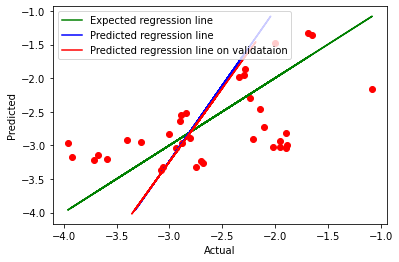

In [140]:
perform_model(data_aggregation_snv)

In [141]:
data_aggregation_snv={}
data_aggregation_snv['training']=snv(data_aggregation['training'])
data_aggregation_snv['validation']=snv(data_aggregation['validation'])
data_aggregation_snv['ref']=snv(data_aggregation['ref'])

In [142]:
data_aggregation_snv_standard={}
data_aggregation_snv_standard['training']=calc_standard(data_aggregation_snv['training'])
data_aggregation_snv_standard['validation']=calc_standard(data_aggregation_snv['validation'])
data_aggregation_snv_standard['ref']=calc_standard(data_aggregation_snv['ref'])

RMSE on the test set = 0.854550821623217
R2  on the test set = -0.002454408617805104
RMSE on the validation set = 0.7890986361338125
R2  on the validation set = 0.377323342451757


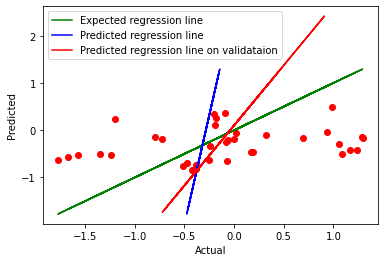

In [143]:
perform_model(data_aggregation_snv_standard)

In [144]:
data_aggregation_nv={}
data_aggregation_nv['training']=Vector_normalization(data_aggregation['training'])
data_aggregation_nv['validation']=Vector_normalization(data_aggregation['validation'])
data_aggregation_nv['ref']=Vector_normalization(data_aggregation['ref'])

RMSE on the test set = 0.03969330275422773
R2  on the test set = 0.3064983466137219
RMSE on the validation set = 0.031088370288715174
R2  on the validation set = 0.34383814318531736


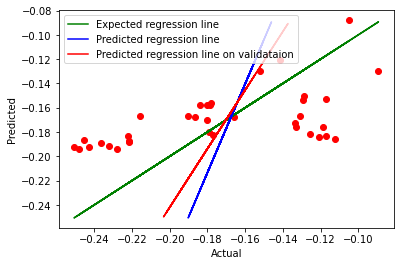

In [145]:
perform_model(data_aggregation_nv)

In [146]:
data_aggregation_nv={}
data_aggregation_nv['training']=Vector_normalization(data_aggregation['training'])
data_aggregation_nv['validation']=Vector_normalization(data_aggregation['validation'])
data_aggregation_nv['ref']=Vector_normalization(data_aggregation['ref'])

In [147]:
data_aggregation_nv_standard={}
data_aggregation_nv_standard['training']=calc_standard(data_aggregation_nv['training'])
data_aggregation_nv_standard['validation']=calc_standard(data_aggregation_nv['validation'])
data_aggregation_nv_standard['ref']=calc_standard(data_aggregation_nv['ref'])

RMSE on the test set = 0.775424252530141
R2  on the test set = 0.3533643575042632
RMSE on the validation set = 0.7927795785669441
R2  on the validation set = 0.3715005398072181


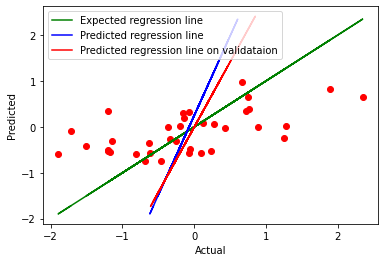

In [148]:
perform_model(data_aggregation_nv_standard)